#  optimize marketing expenses on Yandex.Afisha

<b>About Yandex.Afisha</b><br>
The top Russian site geared towards films and television programs, to present Russians with the option to search showtimes and pre-purchase tickets online.
Users purchase tickets to the cinema for no additional charge by simply editing parameters for the city, theatre, and selected film. Users can then pay for the ticket on their credit card or in-person at the ticket office by presenting an order number that they are sent via text. 

Our task is to help optimize marketing expenses at Yandex.Afisha.
We will find out the following:
 - How people use the product
 - When they start to buy
 - How much money each customer brings
 - When they pay off
 WQe have the following files:
 visits_log_us.csv - The visits table (server logs with data on website visits)
 orders_log_us.csv - The orders table (data on orders)
 costs_us.csv - The costs table (data on marketing expenses)

##  Download the data and prepare it for analysis

In [1]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

In [2]:
try:
    file_name = 'visits_log_us.csv'
    visits = pd.read_csv(
        'https://code.s3.yandex.net/datasets/visits_log_us.csv',
         dtype={'Device': 'category'},
         parse_dates=['Start Ts', 'End Ts'],
     )
except:
  print("An exception occurred will reading csv file", file_name)

try:
    file_name = 'orders_log_us.csv'
    orders = pd.read_csv(
        'https://code.s3.yandex.net/datasets/orders_log_us.csv',
        parse_dates=['Buy Ts'],
    )
except:
  print("An exception occurred will reading csv file", file_name)

try:
    file_name = 'costs_us.csv'
    costs = pd.read_csv(
        'https://code.s3.yandex.net/datasets/costs_us.csv',
        parse_dates=['dt'],
    )
except:
  print("An exception occurred will reading csv file",file_name)

In [3]:
#Explorer data
visits.head()

,Device,End Ts,Source Id,Start Ts,Uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168


In [4]:
#General information
visits.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   Device     359400 non-null  category      
 1   End Ts     359400 non-null  datetime64[ns]
 2   Source Id  359400 non-null  int64         
 3   Start Ts   359400 non-null  datetime64[ns]
 4   Uid        359400 non-null  uint64        
dtypes: category(1), datetime64[ns](2), int64(1), uint64(1)
memory usage: 11.3 MB


In [5]:
#Change data type to a lower  bitness type
visits['Source Id'] = visits['Source Id'].astype(np.int8)

In [6]:
#Check for duplicates
visits.duplicated().sum()

0

There are no duplicated rows in visits table

In [7]:
#General information
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Buy Ts   50415 non-null  datetime64[ns]
 1   Revenue  50415 non-null  float64       
 2   Uid      50415 non-null  uint64        
dtypes: datetime64[ns](1), float64(1), uint64(1)
memory usage: 1.2 MB


In [8]:
#Change data type to a lower  bitness type
orders['Revenue'] = orders['Revenue'].astype(np.float32)

In [9]:
#Check for duplicates
orders.duplicated().sum()

0

There are no duplicated rows in orders table

In [10]:
#Explorer data
orders.head()

,Buy Ts,Revenue,Uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450


In [11]:
#Explorer data
costs.head()

,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08


In [12]:
#General information
costs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   source_id  2542 non-null   int64         
 1   dt         2542 non-null   datetime64[ns]
 2   costs      2542 non-null   float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 59.7 KB


In [13]:
#Change data type to a lower  bitness type
costs['source_id'] =costs['source_id'].astype(np.int8)
costs['costs'] =costs['costs'].astype(np.float16)

In [14]:
#Check for duplicates
costs.duplicated().sum()

0

There are no duplicated rows in costs table

### Conclusion

1. All dates were changes from  object to datetime.
2. visits.Device  is a categorical column

## Make reports and calculate metrics

### Product

#### How many people use it every day, week, and month?

In [15]:
visits['session_year']  = visits['Start Ts'].astype('datetime64[Y]')
visits['session_month'] = visits['Start Ts'].astype('datetime64[M]')
visits['session_week']  = visits['Start Ts'].astype('datetime64[W]')
visits['session_date'] = visits['Start Ts'].dt.date
dau_total = visits.groupby('session_date').agg({'Uid': 'nunique'}).reset_index()
wau_total = visits.groupby(['session_year', 'session_week']).agg({'Uid': 'nunique'}).reset_index()
mau_total = visits.groupby(['session_year', 'session_month']).agg({'Uid': 'nunique'}).reset_index()


In [16]:
#number of unique users using the app every day
dau_total.head(10)

,session_date,Uid
0,2017-06-01,605
1,2017-06-02,608
2,2017-06-03,445
3,2017-06-04,476
4,2017-06-05,820
5,2017-06-06,797
6,2017-06-07,699
7,2017-06-08,868
8,2017-06-09,695
9,2017-06-10,350


In [17]:
fig = px.line(dau_total,x="session_date", y="Uid",title='DAU')

fig.show()

1. On 2017-11-24 there were a lot of sessions due to black fridy.
2. On 2018-03-30 the salses dropped to 0. maybe the service was down for some resons(maintenance, bugs,haker attack) 

In [18]:
#number of unique users using the app every week 
wau_total.head(10)

,session_year,session_week,Uid
0,2017-01-01,2017-06-01,4082
1,2017-01-01,2017-06-08,3311
2,2017-01-01,2017-06-15,2844
3,2017-01-01,2017-06-22,3079
4,2017-01-01,2017-06-29,3055
5,2017-01-01,2017-07-06,3563
6,2017-01-01,2017-07-13,4790
7,2017-01-01,2017-07-20,2978
8,2017-01-01,2017-07-27,2505
9,2017-01-01,2017-08-03,2343


In [19]:
fig = go.Figure(layout=go.Layout(
        title=go.layout.Title(text="WAU")))
fig.add_trace(go.Scatter(x=wau_total['session_week'], 
                        y=wau_total['Uid'],
                    mode='lines+markers',
                    name='lines+markers',line = dict(color='purple', width=5)))

fig.show()

In [20]:
#DAU zoom in on december
fig = px.line(dau_total,x="session_date", y="Uid",title='DAU',range_x=['2017-12-01','2018-1-10'])

fig.show()

1. On 2017-11-23 week there were a lot of sessions due to black fridy.
2. On 2017-12-21 - 2017-12-28 week there was a drop in visits due to Christmas week.
   it is hard to see this drop on DAU graph, but after zooming in on december DAU, we can see that on this week there were days    with small number of visitors(23,24,30,31) comparing to other days and that cause to the strong negative peak  

In [21]:
#number of unique users using the app every month
mau_total.head(10)

,session_year,session_month,Uid
0,2017-01-01,2017-06-01,13259
1,2017-01-01,2017-07-01,14183
2,2017-01-01,2017-08-01,11631
3,2017-01-01,2017-09-01,18975
4,2017-01-01,2017-10-01,29692
5,2017-01-01,2017-11-01,32797
6,2017-01-01,2017-12-01,31557
7,2018-01-01,2018-01-01,28716
8,2018-01-01,2018-02-01,28749
9,2018-01-01,2018-03-01,27473


In [22]:
fig = go.Figure(layout=go.Layout(
        title=go.layout.Title(text="MAU")))
fig.add_trace(go.Scatter(x=mau_total['session_month'], 
                        y=mau_total['Uid'],
                    mode='lines+markers',
                    name='lines+markers',line = dict(color='purple', width=5)))

fig.show()

From august the number of monthly visits start to rise until the peak on november(black fridy is in this month).
From december number of visits start to decrease

In [23]:
#DAU mean
dau_total.mean()

Uid    907.991758
dtype: float64

In [24]:
#WAU mean
wau_total.mean()

Uid    5621.703704
dtype: float64

In [25]:
#MAU mean
mau_total.mean()

Uid    23228.416667
dtype: float64

From those values we can assume that there are users that visits couple of times a week.

#### How many sessions are there per day?

In [26]:
#number of sessions every day
dau_total_sessions = visits.groupby('session_date').agg({'Uid': 'count'}).reset_index()
dau_total_sessions.head()

,session_date,Uid
0,2017-06-01,664
1,2017-06-02,658
2,2017-06-03,477
3,2017-06-04,510
4,2017-06-05,893


In [27]:
fig = px.line(dau_total_sessions,
              x="session_date", y="Uid",title='Sessions per day',
               )
fig.show()

On 2017-11-24 there were a lot of sessions due to black fridy.


In [28]:
#number of sessions every day
dau_total_sessions_per_user = visits.groupby('Uid').agg({'session_date': 'count'}).reset_index()
dau_total_sessions_per_user.head()

,Uid,session_date
0,11863502262781,1
1,49537067089222,1
2,297729379853735,1
3,313578113262317,3
4,325320750514679,2


In [29]:
fig = px.line(dau_total_sessions_per_user,
              x="Uid", y="session_date",title='Sessions per user',
               )
fig.show()

In [30]:
dau_total_sessions_per_user['session_date'].mean()

1.5751482453795214

We can see that there are anomalies.<br>
There user that visits the site lots of times(300,600,893)<br>
mean value is 1.5

####  What is the length of each session?

In [31]:
visits['session_duration_sec'] = (visits['End Ts'] - visits['Start Ts']).dt.seconds
visits['session_duration_sec'].head()

0    1080
1    1680
2       0
3    1440
4       0
Name: session_duration_sec, dtype: int64

In [32]:
visits['session_duration_sec'] = (visits['End Ts'] - visits['Start Ts']).dt.total_seconds()
visits['session_duration_sec'].head()

0    1080.0
1    1680.0
2       0.0
3    1440.0
4       0.0
Name: session_duration_sec, dtype: float64

Text(0, 0.5, 'count')

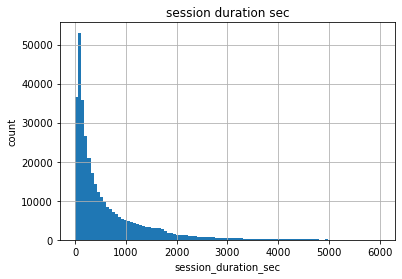

In [33]:
visits.hist('session_duration_sec',bins=100,range=(0,6000));
plt.title('session duration sec')
plt.xlabel('session_duration_sec')
plt.ylabel('count')


In [34]:
visits['session_duration_sec'].mode()

0    60.0
dtype: float64

The distribution 'session_duration_sec' is NOT normal so we calculate the mode and not mean/median
session duration is 60 seconds

In [35]:
# the reviewer's code: if we use the .dt.total_seconds() method:
display(((visits['End Ts'] - visits['Start Ts']).dt.total_seconds()).describe())

# Let's see on the result - we have negative values...

# also, we could use the np.timedelta64(1, 'm') method from the NumPy and get the same result:
import numpy as np
display(((visits['End Ts'] - visits['Start Ts']) / np.timedelta64(1, 'm')).describe())

count    359400.000000
mean        643.025687
std         997.127761
min       -2760.000000
25%         120.000000
50%         300.000000
75%         840.000000
max       42660.000000
dtype: float64

count    359400.000000
mean         10.717095
std          16.618796
min         -46.000000
25%           2.000000
50%           5.000000
75%          14.000000
max         711.000000
dtype: float64

#### How often do users come back?

In [36]:
#Find first_activity_date for each user 
first_activity_date = visits.groupby(['Uid'])['Start Ts'].min()
first_activity_date.name = 'first_activity_date'
#Join the column to the visits df
visits = visits.join(first_activity_date, on='Uid')
#Find activity_month 
visits['activity_month'] = visits['Start Ts'].astype('datetime64[M]')
#Find first_activity_month for each user
visits['first_activity_month'] = visits['first_activity_date'].astype('datetime64[M]')
#Calc cohort_lifetime 
visits['cohort_lifetime'] = ( visits['activity_month'] - visits['first_activity_month'] )
visits['cohort_lifetime'] = (visits[ 'cohort_lifetime' ] / np.timedelta64(1, 'M')).round().astype(int)
#Group the data by cohort and lifetime and find the number of active users at a certain lifetime month for each cohort
visits_by_month = visits.groupby(['first_activity_month', 'cohort_lifetime']).agg({'Uid': 'nunique'}).reset_index()
#Findthe amount of  initial users in the first cohort_lifetime
initial_users_count = visits_by_month[visits_by_month['cohort_lifetime'] == 0][['first_activity_month', 'Uid']]
initial_users_count = initial_users_count.rename(columns={'Uid': 'cohort_users'}) 
#merge initial_users_count 
visits_by_month = visits_by_month.merge(initial_users_count, on='first_activity_month') 
#Calc retention
visits_by_month['retention'] = visits_by_month['Uid'] / visits_by_month['cohort_users'] 

#retention pivot table
retention_pivot = visits_by_month.pivot_table(
    index='first_activity_month',
    columns='cohort_lifetime',
    values='retention',
    aggfunc='sum',
)

retention_pivot

cohort_lifetime,0,1,2,3,4,5,6,7,8,9,10,11
first_activity_month,,,,,,,,,,,,
2017-06-01,1.0,0.078664,0.053775,0.061392,0.068557,0.071423,0.061015,0.057772,0.052342,0.050833,0.040652,0.044951
2017-07-01,1.0,0.056088,0.051294,0.056164,0.058219,0.048174,0.045358,0.045738,0.038813,0.028615,0.027473,NaN
2017-08-01,1.0,0.076908,0.062862,0.062764,0.050093,0.044004,0.036342,0.039485,0.027895,0.026029,NaN,NaN
2017-09-01,1.0,0.085489,0.069205,0.050706,0.039392,0.037835,0.035860,0.024186,0.022809,NaN,NaN,NaN
2017-10-01,1.0,0.078608,0.052239,0.038958,0.034261,0.032221,0.021365,0.020364,NaN,NaN,NaN,NaN
2017-11-01,1.0,0.078281,0.044113,0.038682,0.033727,0.023415,0.021800,NaN,NaN,NaN,NaN,NaN
2017-12-01,1.0,0.055802,0.037993,0.031107,0.020263,0.019036,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-01,1.0,0.059715,0.039339,0.024973,0.020244,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02-01,1.0,0.057080,0.025454,0.020093,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [37]:
visits['cohort_lifetime'].value_counts()

0     267858
1      23294
2      14833
3      11961
4       9977
5       8497
6       6834
7       5290
8       4009
9       3036
10      2193
11      1618
Name: cohort_lifetime, dtype: int64

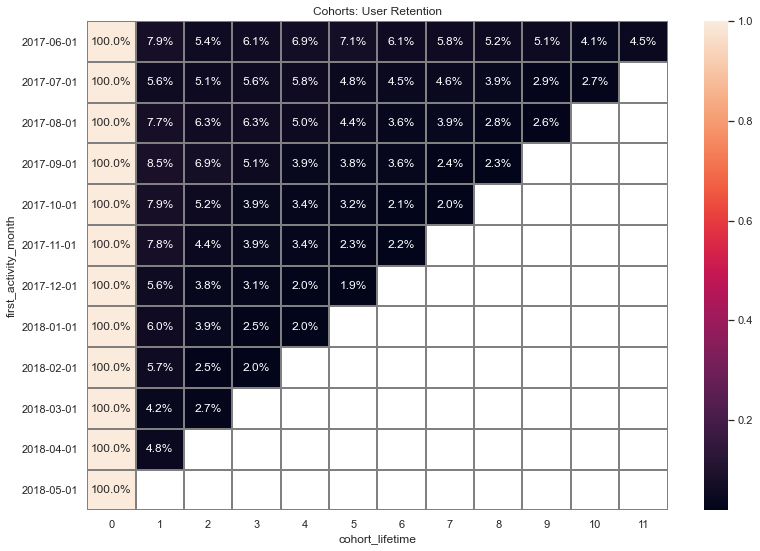

In [38]:
retention_pivot.index=retention_pivot.index.astype(str)
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Cohorts: User Retention')
sns.heatmap(
    retention_pivot, annot=True, fmt='.1%', linewidths=1, linecolor='gray',
);



1. For cohort 2017-09-01 has the best retention  in the first and second months
2. For all cohorts the retention is decreasing every month

####  Conclusion

1. On november is are a lot of visits due to black friday. special sales increases number of visits
2. session duration is 60 seconds
3. For cohort 2017-09-01 has the best retention  in the first and second months
4. For all cohorts the retention is decreasing every month

### Sales

#### When do people start buying

In [39]:
#Find first order for each user
first_order = orders.groupby('Uid')['Buy Ts'].min().reset_index() 
first_order = first_order.rename(columns={'Buy Ts': 'first_order_date'}) 
#Find first activity for each user
first_activity_date = visits.groupby(['Uid'])['Start Ts'].min().reset_index() 
first_activity_date = first_activity_date.rename(columns={'Start Ts':'first_activity_date'} )
#merge df's 
first_activity_and_order = first_activity_date.merge(first_order, on='Uid')
first_activity_and_order.head()

,Uid,first_activity_date,first_order_date
0,313578113262317,2017-09-18 22:49:00,2018-01-03 21:51:00
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00
2,2429014661409475,2017-10-11 17:14:00,2017-10-11 18:33:00
3,2464366381792757,2018-01-27 20:10:00,2018-01-28 15:54:00
4,2551852515556206,2017-11-24 10:14:00,2017-11-24 10:14:00


For each user we have its first activity date and first order date

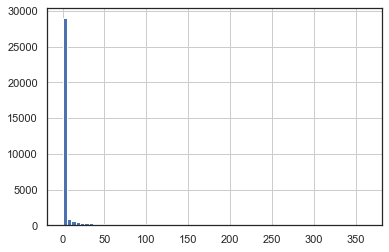

In [40]:
first_activity_and_order['conversion']= ((first_activity_and_order['first_order_date'] - first_activity_and_order['first_activity_date']) / np.timedelta64(1, 'D')).astype(int)
first_activity_and_order['conversion'].hist(bins=70);


In [41]:
first_activity_and_order['conversion'].median()

0.0

As we can see time conversion is 0 day.
That means that in the first visit date  people start buying

In [42]:
overall_conversion = "{:.1%}".format(orders['Uid'].nunique() / visits['Uid'].nunique()) 
overall_conversion

'16.0%'

overall conversion is 16% , that means that 16% of the unique visits became buyers

#### How many orders do they make during a given period of time

In [43]:
orders = orders.merge(first_order,on='Uid')
#Define cohort month by first buy date
orders['first_order_month'] = orders['first_order_date'].astype('datetime64[M]')

orders['order_month'] = orders['Buy Ts'].astype('datetime64[M]')
#Calculate lifetime(age)
orders['cohort_lifetime'] = ( orders['order_month'] - orders['first_order_month'] ) 
orders['cohort_lifetime'] = (orders[ 'cohort_lifetime' ] / np.timedelta64(1, 'M')).round().astype(int)
#Orders by month
orders_by_month = orders.groupby(['first_order_month', 'cohort_lifetime']).agg({'Uid': 'count'}).reset_index()
orders_by_month = orders_by_month.rename(columns={'Uid': 'orders_count'}) 
#Calculate cohort size
#initial_users_count = orders_by_month[orders_by_month['cohort_lifetime'] == 0][['first_order_month', 'orders_count']]
initial_users_count = orders.groupby(['first_order_month']).agg({'Uid': 'nunique'}).reset_index()
initial_users_count = initial_users_count.rename(columns={'Uid': 'cohort_users'}) 
#merger df's
orders_by_month = orders_by_month.merge(initial_users_count, on=['first_order_month']) 
orders_by_month['orders_per_user'] = orders_by_month['orders_count'] / orders_by_month['cohort_users']

In [44]:
orders_by_month.head()

,first_order_month,cohort_lifetime,orders_count,cohort_users,orders_per_user
0,2017-06-01,0,2354,2023,1.163618
1,2017-06-01,1,177,2023,0.087494
2,2017-06-01,2,174,2023,0.086011
3,2017-06-01,3,226,2023,0.111715
4,2017-06-01,4,292,2023,0.144340


In [45]:
orders_by_month_pivot = orders_by_month.pivot_table(
            index='first_order_month',
            columns='cohort_lifetime',
            values='orders_per_user',
            aggfunc='sum'
).cumsum(axis=1)
orders_by_month_pivot

cohort_lifetime,0,1,2,3,4,5,6,7,8,9,10,11
first_order_month,,,,,,,,,,,,
2017-06-01,1.163618,1.251112,1.337123,1.448838,1.593178,1.700939,1.837370,1.923381,2.028176,2.103806,2.151261,2.193772
2017-07-01,1.136765,1.188768,1.251170,1.305252,1.342694,1.385335,1.417057,1.443058,1.473219,1.485699,1.513261,NaN
2017-08-01,1.118978,1.197810,1.270803,1.329927,1.391971,1.437226,1.472993,1.529927,1.563504,1.597080,NaN,NaN
2017-09-01,1.136381,1.221232,1.283611,1.347152,1.373111,1.415343,1.457187,1.478884,1.502518,NaN,NaN,NaN
2017-10-01,1.143779,1.216129,1.253456,1.281567,1.311290,1.335023,1.354839,1.383641,NaN,NaN,NaN,NaN
2017-11-01,1.179368,1.276648,1.321245,1.372948,1.406273,1.420730,1.445724,NaN,NaN,NaN,NaN,NaN
2017-12-01,1.152635,1.214237,1.260324,1.301164,1.320785,1.344741,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-01,1.121554,1.187963,1.235102,1.254076,1.277201,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02-01,1.121611,1.182416,1.205149,1.224322,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


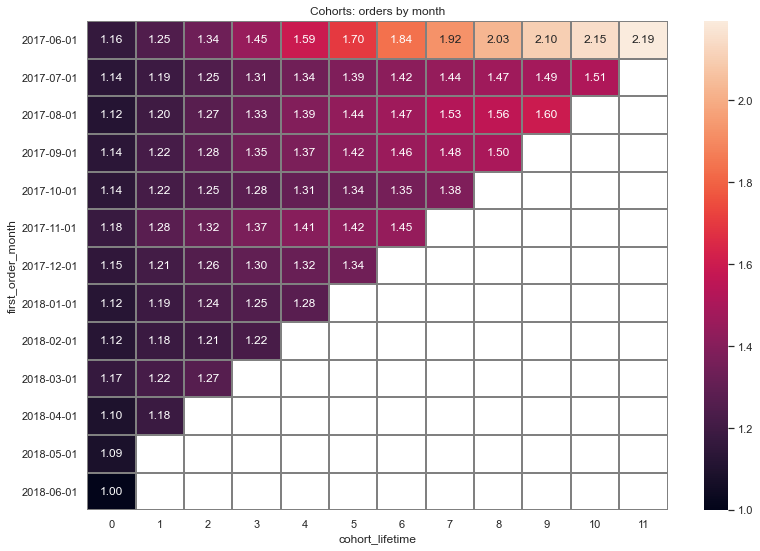

In [46]:
orders_by_month_pivot.index=orders_by_month_pivot.index.astype(str)
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Cohorts: orders by month')
sns.heatmap(
    orders_by_month_pivot, annot=True, fmt='.2f', linewidths=1, linecolor='gray'
);

1. sales are rising every month for all cohorts
2. First cohorts  after 6 month have high number of orders.
   

#### What is the average purchase size

In [47]:
avg_cohort=orders.groupby(['first_order_month','order_month'])['Revenue'].mean().reset_index()
avg_cohort['cohort_lifetime'] = ((avg_cohort['order_month'] - avg_cohort['first_order_month']) / np.timedelta64(1,'M')).round()
avg_cohort.head()


,first_order_month,order_month,Revenue,cohort_lifetime
0,2017-06-01,2017-06-01,4.060106,0.0
1,2017-06-01,2017-07-01,5.547006,1.0
2,2017-06-01,2017-08-01,5.088161,2.0
3,2017-06-01,2017-09-01,8.545575,3.0
4,2017-06-01,2017-10-01,7.084178,4.0


In [48]:
avg_cohort_pivot = avg_cohort.pivot_table(
            index='first_order_month',
            columns='cohort_lifetime',
            values='Revenue',
            aggfunc='mean'
)
avg_cohort_pivot

cohort_lifetime,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0
first_order_month,,,,,,,,,,,,
2017-06-01,4.060106,5.547006,5.088161,8.545575,7.084178,6.825321,6.966449,6.761839,5.279009,8.009870,12.038125,6.042093
2017-07-01,5.287123,6.446100,9.992084,6.637596,4.721806,3.659512,3.789508,5.454400,5.345690,11.790000,5.648302,NaN
2017-08-01,4.715479,5.987315,6.281200,6.617901,7.962941,6.265323,5.890000,7.113590,8.702826,5.598478,NaN,NaN
2017-09-01,4.967109,13.171187,8.351056,62.570244,15.430448,15.321835,16.767130,11.206607,7.785574,NaN,NaN,NaN
2017-10-01,4.374738,7.405128,5.127469,5.590246,5.098992,5.071553,4.280232,4.009120,NaN,NaN,NaN,NaN
2017-11-01,4.370717,4.103955,4.474670,6.284976,4.441471,3.726780,4.598235,NaN,NaN,NaN,NaN,NaN
2017-12-01,4.110746,4.226741,20.072773,26.084358,15.948488,14.111047,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-01,3.687418,4.438482,6.454968,7.524844,2.711282,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02-01,3.706266,4.576487,3.453735,3.867143,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


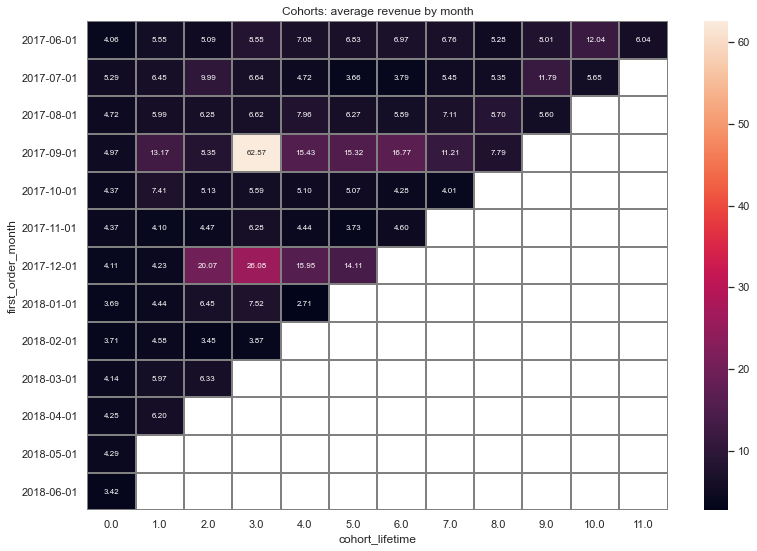

In [49]:
avg_cohort_pivot.index=avg_cohort_pivot.index.astype(str)
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Cohorts: average revenue by month')
sns.heatmap(
    avg_cohort_pivot, annot=True, fmt='.2f', linewidths=1, linecolor='gray',annot_kws={"size": 8}
);

1. 2017-09-01 month after 4 months there is a large revenue 62.57. that falls in december on christmas. so for this cohort christmas is very important to buy gifts 

#### How much money do they bring? (LTV)

In [50]:
#get the revenue per cohort in each month
ltv_cohort=orders.groupby(['first_order_month','order_month'])['Revenue'].sum().reset_index()
ltv_cohort.columns = ['first_order_month','order_month','revenue']
#merge with the cohort size
ltv_cohort=ltv_cohort.merge(initial_users_count,on=['first_order_month'])
ltv_cohort['cohort_lifetime']=((ltv_cohort['order_month'] - ltv_cohort['first_order_month']) / np.timedelta64(1,'M')).round()
ltv_cohort['ltv']=ltv_cohort['revenue']/ltv_cohort['cohort_users']
ltv_cohort.head()

,first_order_month,order_month,revenue,cohort_users,cohort_lifetime,ltv
0,2017-06-01,2017-06-01,9557.490234,2023,0.0,4.724414
1,2017-06-01,2017-07-01,981.820007,2023,1.0,0.485329
2,2017-06-01,2017-08-01,885.340027,2023,2.0,0.437637
3,2017-06-01,2017-09-01,1931.300049,2023,3.0,0.954671
4,2017-06-01,2017-10-01,2068.580078,2023,4.0,1.022531


In [51]:
ltv_cohort_pivot=ltv_cohort.pivot_table(
    index='first_order_month', 
    columns='cohort_lifetime', 
    values='ltv', 
    aggfunc='sum'
).cumsum(axis=1)
ltv_cohort_pivot

cohort_lifetime,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0
first_order_month,,,,,,,,,,,,
2017-06-01,4.724414,5.209743,5.647380,6.602052,7.624582,8.360084,9.310524,9.892116,10.445329,11.051117,11.622378,11.879234
2017-07-01,6.010219,6.345429,6.968960,7.327936,7.504727,7.660775,7.780983,7.922803,8.084036,8.231181,8.386854,NaN
2017-08-01,5.276518,5.748511,6.206993,6.598270,7.092321,7.375861,7.586526,7.991533,8.283745,8.471723,NaN,NaN
2017-09-01,5.644529,6.762116,7.283045,11.258838,11.659396,12.306463,13.008071,13.251221,13.435227,NaN,NaN,NaN
2017-10-01,5.003733,5.539495,5.730889,5.888034,6.039594,6.159956,6.244772,6.360242,NaN,NaN,NaN,NaN
2017-11-01,5.154683,5.553916,5.753472,6.078424,6.226437,6.280316,6.395244,NaN,NaN,NaN,NaN,NaN
2017-12-01,4.738191,4.998565,5.923662,6.988937,7.301866,7.639913,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-01,4.135636,4.430394,4.734675,4.877453,4.940151,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02-01,4.156987,4.435262,4.513777,4.587921,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


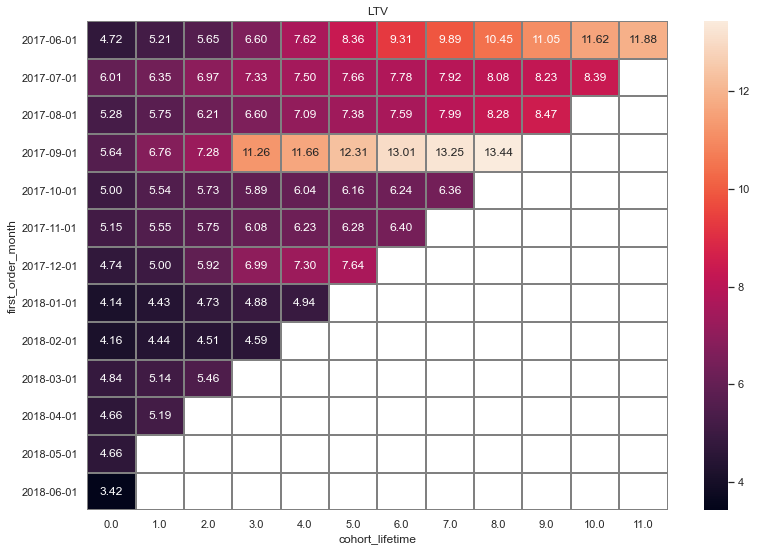

In [52]:
ltv_cohort_pivot.index=ltv_cohort_pivot.index.astype(str)
plt.figure(figsize=(13, 9))
sns.heatmap(ltv_cohort_pivot, annot=True, fmt='.2f', linewidths=1, linecolor='grey').set(title ='LTV')
plt.show()

1. For cohort 2017-09-01 has the best LTV from the 4 lifetime.that falls in december on christmas. so for this cohort christmas is very important to buy gifts.
2. Also for cohort 2017-06-01 has good LTV after 6 months(also  falls in december on christmas)

####  Conclusion

1. first visit date  people start buying
2. overall conversion is 16% , that means that 16% of the unique visits became buyers
3. sales are rising every month for all cohorts
4. First 4 cohorts  after 6 month have high number of orders.
5. 2017-09-01 month after 4 months there is a large revenue 62.57. that falls in december on christmas. so for this cohort        christmas is very important to buy gifts 
6. For cohort 2017-09-01 has the best LTV from the 4 lifetime.that falls in december on christmas. so for this cohort christmas    is very important to buy gifts.
7. Also for cohort 2017-06-01 has good LTV after 6 months(also  falls in december on christmas)

### Marketing

#### How much money was spent? Overall/per source/over time

In [53]:
costs.head()

,source_id,dt,costs
0,1,2017-06-01,75.18750
1,1,2017-06-02,62.25000
2,1,2017-06-03,36.53125
3,1,2017-06-04,55.00000
4,1,2017-06-05,57.09375


In [54]:
#sorting cost
costs=costs.sort_values(by=['dt','source_id'])
costs.head()

,source_id,dt,costs
0,1,2017-06-01,75.1875
363,2,2017-06-01,132.5000
726,3,2017-06-01,349.5000
1089,4,2017-06-01,76.7500
1452,5,2017-06-01,73.2500


In [55]:
print('Total marketing cost is {}'.format(costs['costs'].sum()))

Total marketing cost is inf


In [56]:
costs_by_source = costs.groupby('source_id')['costs'].sum().reset_index()
costs_by_source.sort_values(by='costs')

,source_id,costs
5,9,5516.0
6,10,5824.0
0,1,20832.0
1,2,42816.0
4,5,51744.0
3,4,61088.0
2,3,inf


1.source_id 3 has very high costs.    
2.source_id 9,10 has very low costs

In [57]:
fig = px.line(costs, x="dt", y="costs")
fig.show()

2017-11-24 had a very high cost - in this date there was Black friday , so a lot of money was spent on advertising.
That is correlate with DAU on 2017-11-24 that had a lot of visits  

#### How much did customer acquisition from each of the sources cost?

In [58]:
costs['cost_month']=costs['dt'].astype('datetime64[M]')
costs_by_month=costs.groupby(['cost_month'])['costs'].sum().reset_index()
costs_by_month.columns=['cost_month','costs']
costs_by_month.head()

,cost_month,costs
0,2017-06-01,18016.0
1,2017-07-01,18240.0
2,2017-08-01,14792.0
3,2017-09-01,24368.0
4,2017-10-01,36320.0


In [59]:
fig = px.bar(costs_by_month, x='cost_month', y='costs')
fig.update_xaxes(type='category')
fig.show()

From 2017-10-01 until 2017-12-01 there were high costs due to holidays season. from 2018-01-01 it start to fall

In [60]:
 #costs for each source per month
costs_by_source_and_month=costs.groupby(['cost_month','source_id'])['costs'].sum().reset_index()

costs_by_source_and_month_pivot = costs_by_source_and_month.pivot_table(
                            index='cost_month',
                            columns='source_id',
                            values='costs',
                            aggfunc='sum',)
costs_by_source_and_month_pivot

source_id,1,2,3,4,5,9,10
cost_month,,,,,,,
2017-06-01,1126.0,2428.0,7732.0,3516.0,2616.0,285.250,314.250
2017-07-01,1073.0,2334.0,7676.0,3530.0,2998.0,302.500,329.750
2017-08-01,952.0,1811.0,6144.0,3218.0,2186.0,248.875,232.625
2017-09-01,1502.0,2986.0,9960.0,5192.0,3850.0,415.500,460.750
2017-10-01,2316.0,4844.0,15736.0,6420.0,5768.0,609.500,627.000
2017-11-01,2446.0,5248.0,17024.0,5388.0,6324.0,683.000,792.500
2017-12-01,2342.0,4896.0,16216.0,7680.0,5872.0,658.000,646.000
2018-01-01,2186.0,4156.0,14808.0,5832.0,5372.0,547.000,614.500
2018-02-01,2204.0,4476.0,14232.0,5712.0,5072.0,551.500,481.000


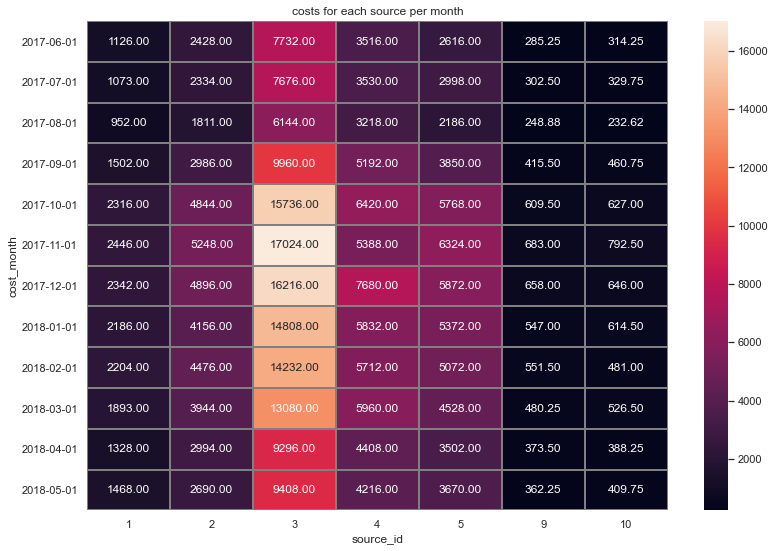

In [61]:
costs_by_source_and_month_pivot.index=costs_by_source_and_month_pivot.index.astype(str)
plt.figure(figsize=(13, 9))
sns.heatmap(costs_by_source_and_month_pivot, annot=True, fmt='.2f', linewidths=1, linecolor='grey' 
            ).set(title ='costs for each source per month')
plt.show()

1. Source 3 has very high costs
2. Sources 9,10 has low costs


In [62]:
orders_per_month=orders.groupby(['first_order_month'])['Uid'].nunique().reset_index()
orders_per_month.columns=['cost_month','buyers']
orders_per_month

,cost_month,buyers
0,2017-06-01,2023
1,2017-07-01,1923
2,2017-08-01,1370
3,2017-09-01,2581
4,2017-10-01,4340
5,2017-11-01,4081
6,2017-12-01,4383
7,2018-01-01,3373
8,2018-02-01,3651
9,2018-03-01,3533


In [63]:
CAC_per_month=costs_by_month.merge(orders_per_month,how='left',on=['cost_month'])
CAC_per_month['CAC']=CAC_per_month['costs']/CAC_per_month['buyers']
CAC_per_month

,cost_month,costs,buyers,CAC
0,2017-06-01,18016.0,2023,8.905586
1,2017-07-01,18240.0,1923,9.485179
2,2017-08-01,14792.0,1370,10.797080
3,2017-09-01,24368.0,2581,9.441302
4,2017-10-01,36320.0,4340,8.368664
5,2017-11-01,37920.0,4081,9.291840
6,2017-12-01,38304.0,4383,8.739220
7,2018-01-01,33504.0,3373,9.932997
8,2018-02-01,32720.0,3651,8.961928
9,2018-03-01,30416.0,3533,8.609114


In [64]:
fig = px.line(CAC_per_month, x="cost_month", y="CAC", title='CAC')
fig.show()

CAC in august was very high and then is start to fall.
The reason maybe to attract new visitors to start buy

#### CAC per source

In [65]:
visits.groupby(['Uid'])['Source Id'].nunique().value_counts()

1    190449
2     28642
3      6792
4      1761
5       442
6        74
7         9
Name: Source Id, dtype: int64

 users have more than one resource. we'll define the first visit resource  as the main source
 

In [66]:
#first_source=visits.sort_values('Start Ts').groupby('Uid').first()['Source Id'].reset_index()
first_source=visits.sort_values('Start Ts').groupby('Uid').agg({"Source Id" : "first"}).reset_index()
first_source.columns=['Uid','first_source']
first_source.head()

,Uid,first_source
0,11863502262781,3
1,49537067089222,2
2,297729379853735,3
3,313578113262317,2
4,325320750514679,5


In [67]:
orders=orders.merge(first_source,on=['Uid'],how='left')
orders.head()

,Buy Ts,Revenue,Uid,first_order_date,first_order_month,order_month,cohort_lifetime,first_source
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00,2017-06-01,2017-06-01,0,1
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00,2017-06-01,2017-06-01,0,2
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00,2017-06-01,2017-06-01,0,2
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00,2017-06-01,2017-06-01,0,2
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00,2017-06-01,2017-06-01,0,3


In [68]:
costs_by_month_source=costs.groupby(['cost_month','source_id'])['costs'].sum().reset_index()
costs_by_month_source.head()

,cost_month,source_id,costs
0,2017-06-01,1,1126.0
1,2017-06-01,2,2428.0
2,2017-06-01,3,7732.0
3,2017-06-01,4,3516.0
4,2017-06-01,5,2616.0


In [69]:
buyers_per_month_source=orders.groupby(['first_order_month','first_source'])['Uid'].nunique().reset_index()
buyers_per_month_source.columns=['cost_month','source_id','buyers']
buyers_per_month_source.head()

,cost_month,source_id,buyers
0,2017-06-01,1,190
1,2017-06-01,2,235
2,2017-06-01,3,638
3,2017-06-01,4,413
4,2017-06-01,5,384


In [70]:
CAC_per_month_source=costs_by_month_source.merge(buyers_per_month_source,how='left',on=['cost_month','source_id'])
CAC_per_month_source['CAC']=CAC_per_month_source['costs']/CAC_per_month_source['buyers']
CAC_per_month_source.head()

,cost_month,source_id,costs,buyers,CAC
0,2017-06-01,1,1126.0,190,5.926316
1,2017-06-01,2,2428.0,235,10.331915
2,2017-06-01,3,7732.0,638,12.119122
3,2017-06-01,4,3516.0,413,8.513317
4,2017-06-01,5,2616.0,384,6.812500


In [71]:
#plotting cac dynamics
fig = px.line(CAC_per_month_source, x="cost_month", y="CAC",color='source_id',title='CAC')
fig.show()

Sources 2,3 have high CAC 

In [72]:
overall_CAC_per_month = CAC_per_month_source.groupby('source_id')['CAC'].mean().reset_index()
overall_CAC_per_month

,source_id,CAC
0,1,7.213093
1,2,12.504622
2,3,13.802062
3,4,6.439556
4,5,7.452139
5,9,5.413587
6,10,4.867558


In [73]:
fig = px.bar(overall_CAC_per_month, x='source_id', y='CAC')
fig.update_xaxes(type='category')
fig.show()

Sources 2,3 have also high CAC in average

#### How worthwhile where the investments? (ROI)

 ROI per month

In [74]:
CAC_per_month_ROI=CAC_per_month[['cost_month','CAC']]
CAC_per_month_ROI.columns=['first_order_month','CAC']
ROI=ltv_cohort.merge(CAC_per_month_ROI,on=['first_order_month'],how='left')
ROI.head()

,first_order_month,order_month,revenue,cohort_users,cohort_lifetime,ltv,CAC
0,2017-06-01,2017-06-01,9557.490234,2023,0.0,4.724414,8.905586
1,2017-06-01,2017-07-01,981.820007,2023,1.0,0.485329,8.905586
2,2017-06-01,2017-08-01,885.340027,2023,2.0,0.437637,8.905586
3,2017-06-01,2017-09-01,1931.300049,2023,3.0,0.954671,8.905586
4,2017-06-01,2017-10-01,2068.580078,2023,4.0,1.022531,8.905586


In [75]:
ROI['ROI']=ROI['ltv']/ROI['CAC']
roi_pivot = ROI.pivot_table(
    index='first_order_month', columns='cohort_lifetime', values='ROI', aggfunc='mean'
).cumsum(axis=1).round(2) 
roi_pivot

cohort_lifetime,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0
first_order_month,,,,,,,,,,,,
2017-06-01,0.53,0.58,0.63,0.74,0.86,0.94,1.05,1.11,1.17,1.24,1.31,1.33
2017-07-01,0.63,0.67,0.73,0.77,0.79,0.81,0.82,0.84,0.85,0.87,0.88,NaN
2017-08-01,0.49,0.53,0.57,0.61,0.66,0.68,0.70,0.74,0.77,0.78,NaN,NaN
2017-09-01,0.60,0.72,0.77,1.19,1.23,1.30,1.38,1.40,1.42,NaN,NaN,NaN
2017-10-01,0.60,0.66,0.68,0.70,0.72,0.74,0.75,0.76,NaN,NaN,NaN,NaN
2017-11-01,0.55,0.60,0.62,0.65,0.67,0.68,0.69,NaN,NaN,NaN,NaN,NaN
2017-12-01,0.54,0.57,0.68,0.80,0.84,0.87,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-01,0.42,0.45,0.48,0.49,0.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02-01,0.46,0.49,0.50,0.51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


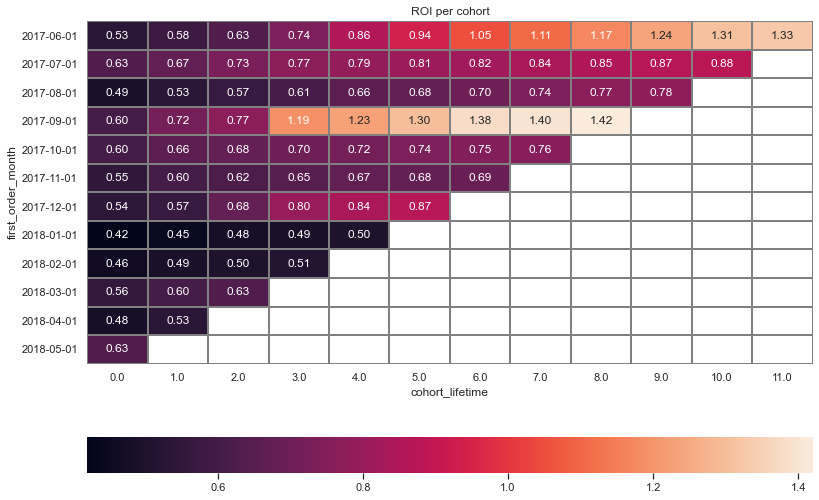

In [76]:
roi_pivot.index=roi_pivot.index.astype(str)
plt.figure(figsize=(13, 9))
sns.heatmap(roi_pivot, annot=True, fmt='.2f', linewidths=1, linecolor='grey', cbar_kws= {'orientation': 'horizontal'} 
            ).set(title ='ROI per cohort')
plt.show()

1. Cohort 2017-09-01 from month 3 -8 has the best roi
2. Cohort 2017-06-01 also has a good roi from month 6-11
3. All cohorts has almost the same roi in the first 3 months

ROI per source

In [77]:
ltv_per_source=orders.groupby(['first_source'])['Uid','Revenue'].agg({'Uid':'nunique','Revenue':'sum'}).reset_index()
ltv_per_source.columns=['source_id','buyers','revenue']
ltv_per_source['ltv']=ltv_per_source['revenue']/ltv_per_source['buyers']
ltv_per_source

<ipython-input-77-6f6ea48baa03>:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,source_id,buyers,revenue,ltv
0,1,2899,31090.550781,10.724578
1,2,3506,46923.609375,13.383802
2,3,10473,54511.238281,5.204931
3,4,10296,56696.832031,5.506685
4,5,6931,52624.019531,7.592558
5,7,1,1.220000,1.220000
6,9,1088,5759.399902,5.293566
7,10,1329,4450.330078,3.348631


In [78]:
roi_per_source=costs_by_source.merge(ltv_per_source,on=['source_id'])
roi_per_source['cac']=roi_per_source['costs']/roi_per_source['buyers']
roi_per_source['romi']=roi_per_source['ltv']/roi_per_source['cac']
roi_per_source

,source_id,costs,buyers,revenue,ltv,cac,romi
0,1,20832.0,2899,31090.550781,10.724578,7.185926,1.492442
1,2,42816.0,3506,46923.609375,13.383802,12.212208,1.095936
2,3,inf,10473,54511.238281,5.204931,inf,0.000000
3,4,61088.0,10296,56696.832031,5.506685,5.933178,0.928117
4,5,51744.0,6931,52624.019531,7.592558,7.465589,1.017007
5,9,5516.0,1088,5759.399902,5.293566,5.069853,1.044126
6,10,5824.0,1329,4450.330078,3.348631,4.382242,0.764136


In [79]:
fig = px.bar(roi_per_source, x='source_id', y='romi')
fig.update_xaxes(type='category')
fig.show()

1. Source 1 has the best romi. for each dollar of CAC we earn 1.4 dollars
2. Sources 2,5,9 are also profitable but very little. i dont think that it worht it.
3. Sorces 3,4,10 are not profitable. we shoult not advertise there
4. We should focus on source 1 and increrace advertise there

#### Conclusion

1. Total marketing cost is 329131.62
2. source_id 3 has very high costs.
3. source_id 9,10 has very low costs
4. 2017-11-24 had a very high cost - in this date there was Black friday , so a lot of money was spent on advertising
5. Cohort 2017-09-01 from month 3 -8 has the best roi
6. Cohort 2017-06-01 also has a good roi from month 6-11
7. All cohorts has almost the same roi in the first 3 months
8. Source 1 has the best romi. for each dollar of CAC we earn 1.4 dollars
9. Sources 2,5,9 are also profitable but very little. i dont think that it worht it.
10. Sorces 3,4,10 are not profitable. we shoult not advertise there
11. We should focus on source 1 and increrace advertise there

## Overall conclusion 


- session duration is 60 seconds
- For cohort 2017-09-01 has the best retention  in the first and second months
- For all cohorts the retention is decreasing every month
- first visit date  people start buying
- overall conversion is 16% , that means that 16% of the unique visits became buyers
- sales are rising every month for all cohorts
- First 4 cohorts  after 6 month have high number of orders.
- 2017-09-01 month after 4 months there is a large revenue 62.57. that falls in december on christmas. so for this cohort         christmas is very important to buy gifts 
- For cohort 2017-09-01 has the best LTV from the 4 lifetime.that falls in december on christmas. so for this cohort christmas     is very important to buy gifts.
- Also for cohort 2017-06-01 has good LTV after 6 months(also  falls in december on christmas)

- Cohort 2017-09-01 from month 3 -8 has the best roi.
- For cohort 2017-09-01 has the best LTV from the 4 lifetime.that falls in december on christmas. so for this cohort christmas     is very important to buy gifts.
- cohort 2017-09-01 has the best roi
- Source 1 has the best romi. for each dollar of CAC we earn 1.4 dollars.
   We should focus on this Source and increrace advertise
- we should focus on users from cohort 2017-09-01 and increase advertising to them from source1
  
- Special sales days like black friday increases visits and orders.we should increase costs on those days to attract more visits and orders